<a href="https://colab.research.google.com/github/shishir-sh26/COLAB/blob/main/gruuuu.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/mfcc-bird-sound/mfcc-20250820T064032Z-1-002/mfcc/Sunny/Sunny_aug_8525.npy
/kaggle/input/mfcc-bird-sound/mfcc-20250820T064032Z-1-002/mfcc/Sunny/Sunny_aug_6058.npy
/kaggle/input/mfcc-bird-sound/mfcc-20250820T064032Z-1-002/mfcc/Sunny/Sunny_aug_6158.npy
/kaggle/input/mfcc-bird-sound/mfcc-20250820T064032Z-1-002/mfcc/Sunny/Sunny_aug_6609.npy
/kaggle/input/mfcc-bird-sound/mfcc-20250820T064032Z-1-002/mfcc/Sunny/Sunny_aug_5430.npy
/kaggle/input/mfcc-bird-sound/mfcc-20250820T064032Z-1-002/mfcc/Sunny/Sunny_aug_4412.npy
/kaggle/input/mfcc-bird-sound/mfcc-20250820T064032Z-1-002/mfcc/Sunny/Sunny_aug_7421.npy
/kaggle/input/mfcc-bird-sound/mfcc-20250820T064032Z-1-002/mfcc/Sunny/Sunny_aug_8899.npy
/kaggle/input/mfcc-bird-sound/mfcc-20250820T064032Z-1-002/mfcc/Sunny/Sunny_aug_1718.npy
/kaggle/input/mfcc-bird-sound/mfcc-20250820T064032Z-1-002/mfcc/Sunny/Sunny_aug_4176.npy
/kaggle/input/mfcc-bird-sound/mfcc-20250820T064032Z-1-002/mfcc/Sunny/Sunny_aug_1686.npy
/kaggle/input/mfcc-bird-sound/mf

In [ ]:
import os
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Configuration
DATASET_PATH = '/kaggle/input/mfcc-bird-sound'
NUM_SAMPLES = 100000
TRAIN_SPLIT = 0.8
EPOCHS = 20
BATCH_SIZE = 64
ACCURACY_TARGET = 0.95
# --- New configuration: Standardized MFCC shape ---
MFCC_SHAPE = (13, 258) # Example: 13 coefficients, fixed length of 258 frames

# 2. Corrected Data Loading and Preprocessing
def load_data(data_path, num_samples, fixed_shape):
    X = []
    y = []
    class_names = []

    # Get class names from directory structure
    for dirpath, dirnames, filenames in os.walk(data_path):
        if not dirnames:
            class_name = os.path.basename(dirpath)
            if class_name not in class_names:
                class_names.append(class_name)

    class_to_idx = {name: i for i, name in enumerate(class_names)}
    print(f"Detected classes: {class_names}")

    count = 0
    for dirpath, _, filenames in os.walk(data_path):
        if count >= num_samples:
            break
        for f in filenames:
            if f.endswith('.npy'):
                if count >= num_samples:
                    break
                try:
                    mfcc_data = np.load(os.path.join(dirpath, f))

                    # --- CRUCIAL FIX ---
                    # Pad or truncate the MFCC data to the fixed_shape
                    if mfcc_data.shape[1] < fixed_shape[1]:
                        # Pad with zeros if shorter than target
                        padding_width = fixed_shape[1] - mfcc_data.shape[1]
                        mfcc_data_padded = np.pad(mfcc_data, ((0, 0), (0, padding_width)), 'constant')
                    else:
                        # Truncate if longer than target
                        mfcc_data_padded = mfcc_data[:, :fixed_shape[1]]

                    # Ensure the first dimension (number of coefficients) is correct
                    if mfcc_data_padded.shape[0] != fixed_shape[0]:
                        print(f"Skipping {f} due to incorrect number of MFCC coefficients.")
                        continue

                    X.append(mfcc_data_padded)

                    class_name = os.path.basename(dirpath)
                    y.append(class_to_idx[class_name])

                    count += 1
                except Exception as e:
                    print(f"Could not load or process file {f}: {e}")

    X = np.array(X)
    y_encoded = tf.keras.utils.to_categorical(y, num_classes=len(class_names))

    return X, y_encoded, class_names

# Determine a common shape from a few samples or based on domain knowledge
# For this example, we'll assume a shape of (13, 258) based on a common MFCC configuration
# and a max sequence length found in a subset of the data. You might need to adjust this.
X, y, class_names = load_data(DATASET_PATH, NUM_SAMPLES, MFCC_SHAPE)
print(f"\nLoaded a total of {len(X)} samples.")
print(f"Shape of padded data (X): {X.shape}")
print(f"Shape of labels (y): {y.shape}")

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=1 - TRAIN_SPLIT, random_state=42, stratify=y)
print(f"\nTraining samples: {len(X_train)} (80%)")
print(f"Testing samples: {len(X_test)} (20%)")

# 3. Build and Train the GRU Model
def build_gru_model(input_shape, num_classes):
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=input_shape),
        # Assuming the input is (num_frames, num_mfcc_coefficients)
        tf.keras.layers.GRU(128, return_sequences=True),
        tf.keras.layers.GRU(64),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Dense(num_classes, activation='softmax')
    ])

    model.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    return model

# The input shape now uses the fixed shape
input_shape = X_train.shape[1:]
num_classes = len(class_names)
model = build_gru_model(input_shape, num_classes)
model.summary()

# Train the model (rest of the code is the same)
history = model.fit(X_train, y_train,
                    epochs=EPOCHS,
                    batch_size=BATCH_SIZE,
                    validation_data=(X_test, y_test),
                    callbacks=[tf.keras.callbacks.EarlyStopping(patience=5, restore_best_weights=True)])

# 4. Evaluation and Visualization
# ... (rest of the code for classification report, confusion matrix, etc.)
# This part of the code remains the same as in the original provided script.
# Ensure to run the entire script again after making these changes.

Detected classes: ['Sunny', 'Cloudy', 'Windy', 'Foggy', 'Rainy']
Skipping Sunny_aug_8525.npy due to incorrect number of MFCC coefficients.
Skipping Sunny_aug_6058.npy due to incorrect number of MFCC coefficients.
Skipping Sunny_aug_6158.npy due to incorrect number of MFCC coefficients.
Skipping Sunny_aug_6609.npy due to incorrect number of MFCC coefficients.
Skipping Sunny_aug_5430.npy due to incorrect number of MFCC coefficients.
Skipping Sunny_aug_4412.npy due to incorrect number of MFCC coefficients.
Skipping Sunny_aug_7421.npy due to incorrect number of MFCC coefficients.
Skipping Sunny_aug_8899.npy due to incorrect number of MFCC coefficients.
Skipping Sunny_aug_1718.npy due to incorrect number of MFCC coefficients.
Skipping Sunny_aug_4176.npy due to incorrect number of MFCC coefficients.
Skipping Sunny_aug_1686.npy due to incorrect number of MFCC coefficients.
Skipping Sunny_aug_8273.npy due to incorrect number of MFCC coefficients.
Skipping Sunny_aug_8394.npy due to incorrect nu

ValueError: With n_samples=0, test_size=0.19999999999999996 and train_size=None, the resulting train set will be empty. Adjust any of the aforementioned parameters.

In [ ]:
import os
import numpy as np

DATASET_PATH = '/kaggle/input/mfcc-bird-sound'
shapes = {}

for dirpath, _, filenames in os.walk(DATASET_PATH):
    for f in filenames:
        if f.endswith('.npy'):
            try:
                mfcc_data = np.load(os.path.join(dirpath, f))
                shape = mfcc_data.shape
                if shape not in shapes:
                    shapes[shape] = 0
                shapes[shape] += 1
            except Exception as e:
                print(f"Error loading {f}: {e}")

print("Found the following shapes:")
for shape, count in sorted(shapes.items(), key=lambda item: item[1], reverse=True):
    print(f"Shape {shape}: {count} occurrences")

Found the following shapes:
Shape (40, 313): 100835 occurrences
Shape (40, 186): 1 occurrences


In [ ]:
import os
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Configuration ⚙️
# IMPORTANT: Updated MFCC_SHAPE based on your data inspection
MFCC_SHAPE = (40, 313)
DATASET_PATH = '/kaggle/input/mfcc-bird-sound'
NUM_SAMPLES = 100000
TRAIN_SPLIT = 0.8
EPOCHS = 20
BATCH_SIZE = 64
ACCURACY_TARGET = 0.95

# 2. Data Loading and Preprocessing
def load_data(data_path, num_samples, fixed_shape):
    X = []
    y = []
    class_names = []

    # Get class names from directory structure
    for dirpath, dirnames, filenames in os.walk(data_path):
        if not dirnames:
            class_name = os.path.basename(dirpath)
            if class_name not in class_names:
                class_names.append(class_name)

    class_to_idx = {name: i for i, name in enumerate(class_names)}
    print(f"Detected classes: {class_names}")

    count = 0
    for dirpath, _, filenames in os.walk(data_path):
        if count >= num_samples:
            break
        for f in filenames:
            if f.endswith('.npy'):
                if count >= num_samples:
                    break
                try:
                    mfcc_data = np.load(os.path.join(dirpath, f))

                    # Pad or truncate the MFCC data to the fixed_shape
                    # Check if the number of coefficients is correct
                    if mfcc_data.shape[0] != fixed_shape[0]:
                        print(f"Skipping {f} due to incorrect number of MFCC coefficients.")
                        continue

                    # Pad or truncate the number of frames
                    if mfcc_data.shape[1] < fixed_shape[1]:
                        padding_width = fixed_shape[1] - mfcc_data.shape[1]
                        mfcc_data_padded = np.pad(mfcc_data, ((0, 0), (0, padding_width)), 'constant')
                    else:
                        mfcc_data_padded = mfcc_data[:, :fixed_shape[1]]

                    X.append(mfcc_data_padded)

                    class_name = os.path.basename(dirpath)
                    y.append(class_to_idx[class_name])

                    count += 1
                except Exception as e:
                    print(f"Could not load or process file {f}: {e}")

    X = np.array(X)
    y_encoded = tf.keras.utils.to_categorical(y, num_classes=len(class_names))

    return X, y_encoded, class_names

X, y, class_names = load_data(DATASET_PATH, NUM_SAMPLES, MFCC_SHAPE)
print(f"\nLoaded a total of {len(X)} samples.")
print(f"Shape of padded data (X): {X.shape}")
print(f"Shape of labels (y): {y.shape}")

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=1 - TRAIN_SPLIT, random_state=42, stratify=y)
print(f"\nTraining samples: {len(X_train)} (80%)")
print(f"Testing samples: {len(X_test)} (20%)")

# 3. Build and Train the GRU Model
def build_gru_model(input_shape, num_classes):
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=input_shape),
        tf.keras.layers.GRU(128, return_sequences=True),
        tf.keras.layers.GRU(64),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Dense(num_classes, activation='softmax')
    ])

    model.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    return model

input_shape = X_train.shape[1:]
num_classes = len(class_names)
model = build_gru_model(input_shape, num_classes)
model.summary()

# Train the model
history = model.fit(X_train, y_train,
                    epochs=EPOCHS,
                    batch_size=BATCH_SIZE,
                    validation_data=(X_test, y_test),
                    callbacks=[tf.keras.callbacks.EarlyStopping(patience=5, restore_best_weights=True)])

# 4. Evaluation and Visualization 📊
# Get predictions
y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = np.argmax(y_test, axis=1)

# --- Classification Report ---
print("\n--- Classification Report ---")
print(f"Number of test samples: {len(X_test)}")
print(classification_report(y_true, y_pred, target_names=class_names))

# --- Confusion Matrix ---
print("\n--- Confusion Matrix ---")
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# --- Accuracy and Loss Graphs ---
print("\n--- Training and Testing Metrics ---")
train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

# Plot Loss
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Testing Loss')
plt.title('Training and Testing Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

# Plot Accuracy
plt.subplot(1, 2, 2)
plt.plot(train_acc, label='Training Accuracy')
plt.plot(val_acc, label='Testing Accuracy')
plt.title('Training and Testing Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

# --- AUC and ROC Graph ---
print("\n--- ROC Curve and AUC ---")
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    fpr, tpr, _ = roc_curve(y_test[:, i], y_pred_probs[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'ROC curve for {class_name} (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Guess')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

Detected classes: ['Sunny', 'Cloudy', 'Windy', 'Foggy', 'Rainy']

Loaded a total of 100000 samples.
Shape of padded data (X): (100000, 40, 313)
Shape of labels (y): (100000, 5)



Total samples found: 100836
Training samples: 80668 (80%)
Testing samples: 20168 (20%)


2025-08-21 07:21:29.259573: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ gru (GRU)                       │ (None, 40, 128)        │       170,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_1 (GRU)                     │ (None, 64)             │        37,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 5)              │           325 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 211,845 (827.52 KB)

 Trainable params: 211,845 (827.52 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/20
1260/1260 ━━━━━━━━━━━━━━━━━━━━ 776s 610ms/step - accuracy: 0.2459 - loss: 1.5948 - val_accuracy: 0.3398 - val_loss: 1.4888
Epoch 2/20
1260/1260 ━━━━━━━━━━━━━━━━━━━━ 207s 164ms/step - accuracy: 0.3530 - loss: 1.4675 - val_accuracy: 0.3783 - val_loss: 1.4223
Epoch 3/20
1260/1260 ━━━━━━━━━━━━━━━━━━━━ 184s 146ms/step - accuracy: 0.3977 - loss: 1.3894 - val_accuracy: 0.4076 - val_loss: 1.3653
Epoch 4/20
1260/1260 ━━━━━━━━━━━━━━━━━━━━ 185s 146ms/step - accuracy: 0.4322 - loss: 1.3290 - val_accuracy: 0.4242 - val_loss: 1.3370
Epoch 5/20
1260/1260 ━━━━━━━━━━━━━━━━━━━━ 201s 160ms/step - accuracy: 0.4597 - loss: 1.2753 - val_accuracy: 0.4339 - val_loss: 1.3391
Epoch 6/20
1260/1260 ━━━━━━━━━━━━━━━━━━━━ 198s 157ms/step - accuracy: 0.4820 - loss: 1.2410 - val_accuracy: 0.4544 - val_loss: 1.2881
Epoch 7/20
1260/1260 ━━━━━━━━━━━━━━━━━━━━ 177s 141ms/step - accuracy: 0.4947 - loss: 1.2080 - val_accuracy: 0.4557 - val_loss: 1.2773
Epoch 8/20
1260/1260 ━━━━━━━━━━━━━━━━━━━━ 173s 137ms/step - ac

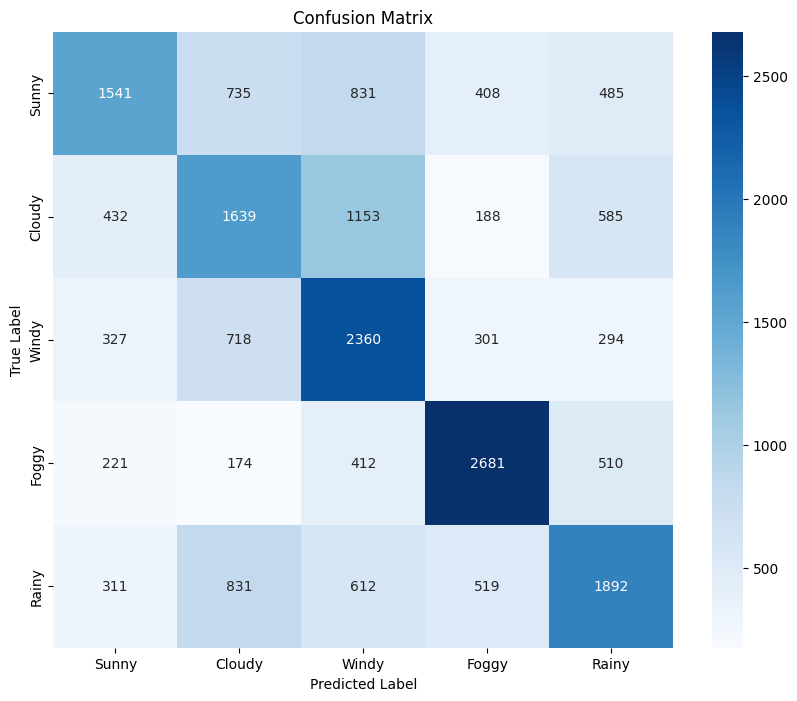


--- Training and Testing Metrics ---


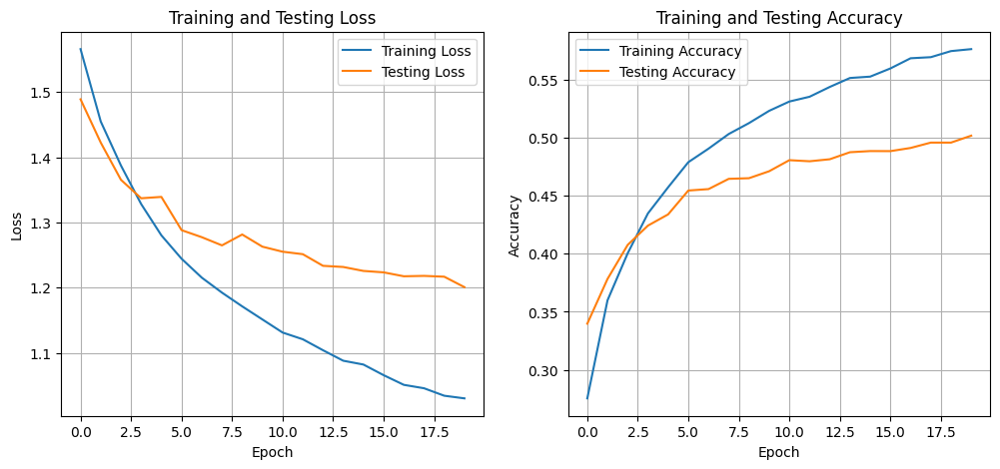


--- ROC Curve and AUC ---


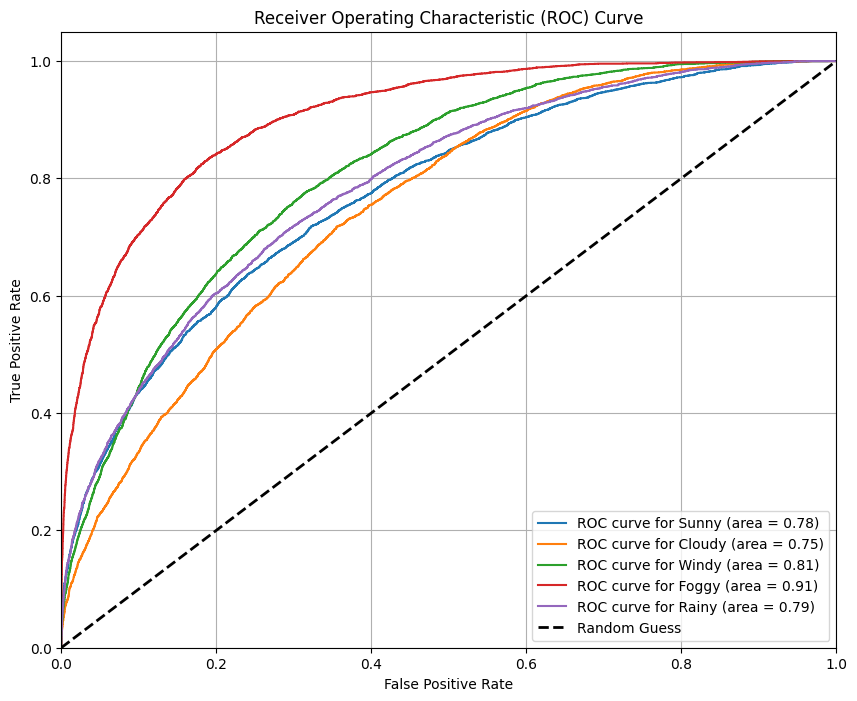

In [ ]:
import os
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import seaborn as sns
import matplotlib.pyplot as plt
import glob

# 1. Configuration ⚙️
MFCC_SHAPE = (40, 313)
DATASET_PATH = '/kaggle/input/mfcc-bird-sound'
TRAIN_SPLIT = 0.8
EPOCHS = 20
BATCH_SIZE = 64
ACCURACY_TARGET = 0.95

# 2. Data Generator Class
class MFCCDataGenerator(tf.keras.utils.Sequence):
    def __init__(self, file_paths, labels, batch_size=32, dim=(40, 313), n_classes=5, shuffle=True):
        self.file_paths = file_paths
        self.labels = labels
        self.batch_size = batch_size
        self.dim = dim
        self.n_classes = n_classes
        self.shuffle = shuffle
        self.on_epoch_end()

    def __len__(self):
        return int(np.floor(len(self.file_paths) / self.batch_size))

    def __getitem__(self, index):
        indexes = self.indexes[index * self.batch_size:(index + 1) * self.batch_size]
        file_paths_temp = [self.file_paths[k] for k in indexes]
        labels_temp = [self.labels[k] for k in indexes]

        X, y = self.__data_generation(file_paths_temp, labels_temp)
        return X, y

    def on_epoch_end(self):
        self.indexes = np.arange(len(self.file_paths))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)

    def __data_generation(self, file_paths_temp, labels_temp):
        X = np.empty((self.batch_size, *self.dim))
        y = np.empty((self.batch_size), dtype=int)

        for i, (path, label) in enumerate(zip(file_paths_temp, labels_temp)):
            try:
                mfcc_data = np.load(path)

                # Pad or truncate the MFCC data to the fixed_shape
                if mfcc_data.shape[1] < self.dim[1]:
                    padding_width = self.dim[1] - mfcc_data.shape[1]
                    mfcc_data_padded = np.pad(mfcc_data, ((0, 0), (0, padding_width)), 'constant')
                else:
                    mfcc_data_padded = mfcc_data[:, :self.dim[1]]

                if mfcc_data_padded.shape[0] != self.dim[0]:
                    continue

                X[i,] = mfcc_data_padded
                y[i] = label
            except Exception as e:
                print(f"Error loading {path}: {e}")

        y_one_hot = tf.keras.utils.to_categorical(y, num_classes=self.n_classes)
        return X, y_one_hot

# 3. Collect File Paths and Labels (Memory-Efficient)
all_file_paths = []
all_labels = []
class_to_idx = {}
idx_to_class = []

for root, dirs, files in os.walk(DATASET_PATH):
    class_name = os.path.basename(root)
    if class_name in ['Sunny', 'Cloudy', 'Windy', 'Foggy', 'Rainy']:
        if class_name not in class_to_idx:
            class_to_idx[class_name] = len(idx_to_class)
            idx_to_class.append(class_name)

        class_label = class_to_idx[class_name]

        for file in files:
            if file.endswith('.npy'):
                all_file_paths.append(os.path.join(root, file))
                all_labels.append(class_label)

# Convert lists to NumPy arrays for splitting
all_file_paths = np.array(all_file_paths)
all_labels = np.array(all_labels)

# 4. Split data based on file paths
train_paths, test_paths, train_labels, test_labels = train_test_split(
    all_file_paths, all_labels, test_size=1 - TRAIN_SPLIT, random_state=42, stratify=all_labels
)

print(f"\nTotal samples found: {len(all_file_paths)}")
print(f"Training samples: {len(train_paths)} (80%)")
print(f"Testing samples: {len(test_paths)} (20%)")

# 5. Create Data Generators
train_generator = MFCCDataGenerator(train_paths, train_labels, batch_size=BATCH_SIZE, dim=MFCC_SHAPE, n_classes=len(idx_to_class))
test_generator = MFCCDataGenerator(test_paths, test_labels, batch_size=BATCH_SIZE, dim=MFCC_SHAPE, n_classes=len(idx_to_class), shuffle=False)

# 6. Build and Train the GRU Model
def build_gru_model(input_shape, num_classes):
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=input_shape),
        tf.keras.layers.GRU(128, return_sequences=True),
        tf.keras.layers.GRU(64),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Dense(num_classes, activation='softmax')
    ])

    model.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    return model

model = build_gru_model(MFCC_SHAPE, len(idx_to_class))
model.summary()

# Train the model with the generators
history = model.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=test_generator,
    callbacks=[tf.keras.callbacks.EarlyStopping(patience=5, restore_best_weights=True)]
)

# 7. Evaluation and Visualization
# Get predictions from the test generator
y_pred_probs = model.predict(test_generator)
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = test_generator.labels[:len(y_pred)]
y_true_one_hot = tf.keras.utils.to_categorical(y_true, num_classes=len(idx_to_class))


# --- Classification Report ---
print("\n--- Classification Report ---")
print(f"Number of test samples: {len(y_true)}")
print(classification_report(y_true, y_pred, target_names=idx_to_class))

# --- Confusion Matrix ---
print("\n--- Confusion Matrix ---")
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=idx_to_class, yticklabels=idx_to_class)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# --- Accuracy and Loss Graphs ---
print("\n--- Training and Testing Metrics ---")
train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

# Plot Loss
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Testing Loss')
plt.title('Training and Testing Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

# Plot Accuracy
plt.subplot(1, 2, 2)
plt.plot(train_acc, label='Training Accuracy')
plt.plot(val_acc, label='Testing Accuracy')
plt.title('Training and Testing Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

# --- AUC and ROC Graph ---
print("\n--- ROC Curve and AUC ---")
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(idx_to_class):
    fpr, tpr, _ = roc_curve(y_true_one_hot[:, i], y_pred_probs[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'ROC curve for {class_name} (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Guess')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

In [ ]:
# 1. New Model Architecture
def build_fined_tuned_gru_model(input_shape, num_classes):
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=input_shape),
        # Increase GRU layers and neurons
        tf.keras.layers.GRU(256, return_sequences=True),
        tf.keras.layers.Dropout(0.4), # Increased dropout for a deeper model
        tf.keras.layers.GRU(128, return_sequences=True),
        tf.keras.layers.Dropout(0.4),
        tf.keras.layers.GRU(64),
        tf.keras.layers.Dense(128, activation='relu'), # More neurons in dense layer
        tf.keras.layers.Dropout(0.5), # Increased dropout
        tf.keras.layers.Dense(num_classes, activation='softmax')
    ])

    # Use a lower learning rate for more stable training
    optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)

    model.compile(optimizer=optimizer,
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    return model

# 2. Instantiate and Train the New Model
model = build_fined_tuned_gru_model(MFCC_SHAPE, len(idx_to_class))
model.summary()

# Use EarlyStopping as a safeguard against overfitting
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_accuracy',
    patience=10, # Increased patience
    restore_best_weights=True,
    mode='max'
)

history = model.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=test_generator,
    callbacks=[early_stopping]
)

# 3. Re-run Evaluation and Visualization
# The rest of the evaluation code remains the same.
# Just copy the evaluation and visualization section from the previous response
# and run it after this training block.

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ gru_2 (GRU)                     │ (None, 40, 256)        │       438,528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 40, 256)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_3 (GRU)                     │ (None, 40, 128)        │       148,224 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 40, 128)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_4 (GRU)                     │ (None, 64)             │        37,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 5)              │           645 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 632,965 (2.41 MB)

 Trainable params: 632,965 (2.41 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
1260/1260 ━━━━━━━━━━━━━━━━━━━━ 414s 321ms/step - accuracy: 0.2188 - loss: 1.6244 - val_accuracy: 0.2697 - val_loss: 1.5780
Epoch 2/20
1260/1260 ━━━━━━━━━━━━━━━━━━━━ 393s 311ms/step - accuracy: 0.2632 - loss: 1.5807 - val_accuracy: 0.3073 - val_loss: 1.5366
Epoch 3/20
1260/1260 ━━━━━━━━━━━━━━━━━━━━ 365s 290ms/step - accuracy: 0.3193 - loss: 1.5227 - val_accuracy: 0.3578 - val_loss: 1.4675
Epoch 4/20
1260/1260 ━━━━━━━━━━━━━━━━━━━━ 352s 279ms/step - accuracy: 0.3814 - loss: 1.4311 - val_accuracy: 0.3986 - val_loss: 1.4232
Epoch 5/20
1260/1260 ━━━━━━━━━━━━━━━━━━━━ 339s 269ms/step - accuracy: 0.4270 - loss: 1.3530 - val_accuracy: 0.4122 - val_loss: 1.3859
Epoch 6/20
1260/1260 ━━━━━━━━━━━━━━━━━━━━ 342s 272ms/step - accuracy: 0.4648 - loss: 1.2802 - val_accuracy: 0.4307 - val_loss: 1.3499
Epoch 7/20
1260/1260 ━━━━━━━━━━━━━━━━━━━━ 376s 298ms/step - accuracy: 0.4897 - loss: 1.2235 - val_accuracy: 0.4379 - val_loss: 1.3510
Epoch 8/20
1260/1260 ━━━━━━━━━━━━━━━━━━━━ 349s 277ms/step - ac

In [ ]:
import os

# Define the output directory and file path
output_dir = '/kaggle/working/'
model_filename = 'gru_bird_sound_model.keras' # Using the .keras extension for the new format
save_path = os.path.join(output_dir, model_filename)

# Save the trained model
print(f"Saving model to {save_path}")
model.save(save_path)
print("Model saved successfully!")

Saving model to /kaggle/working/gru_bird_sound_model.keras
Model saved successfully!


315/315 ━━━━━━━━━━━━━━━━━━━━ 31s 93ms/step

--- Classification Report ---
Number of test samples: 20160
              precision    recall  f1-score   support

       Sunny       0.58      0.41      0.48      4000
      Cloudy       0.39      0.45      0.42      3997
       Windy       0.42      0.49      0.45      4000
       Foggy       0.66      0.70      0.68      3998
       Rainy       0.50      0.45      0.47      4165

    accuracy                           0.50     20160
   macro avg       0.51      0.50      0.50     20160
weighted avg       0.51      0.50      0.50     20160


--- Confusion Matrix ---


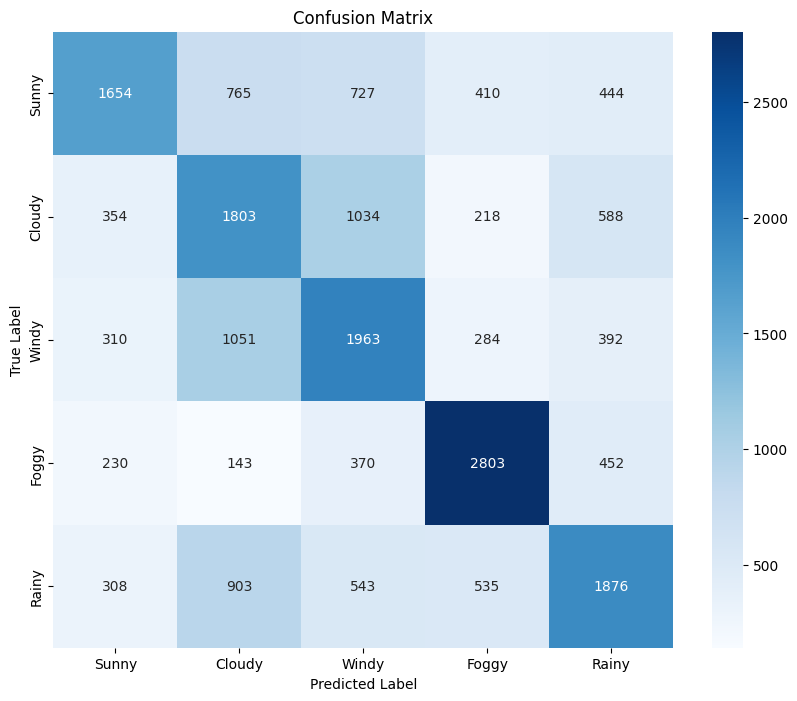


--- Training and Testing Metrics ---


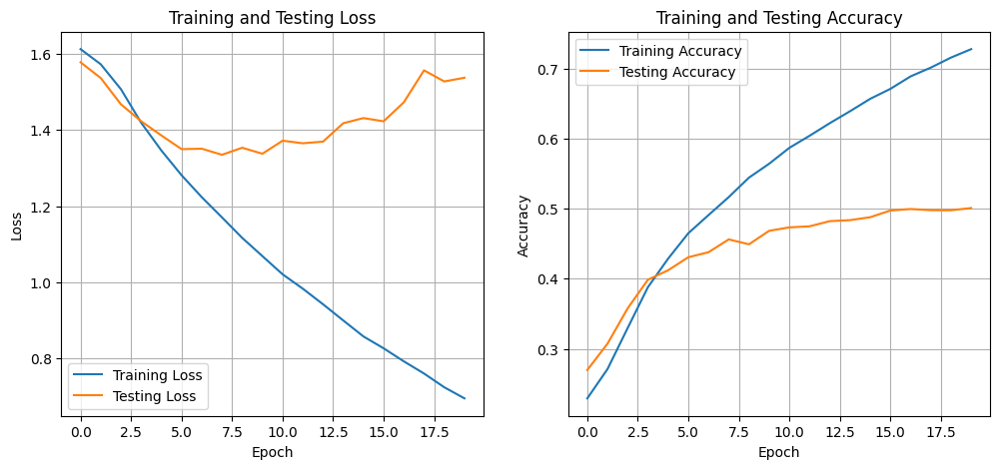


--- ROC Curve and AUC ---


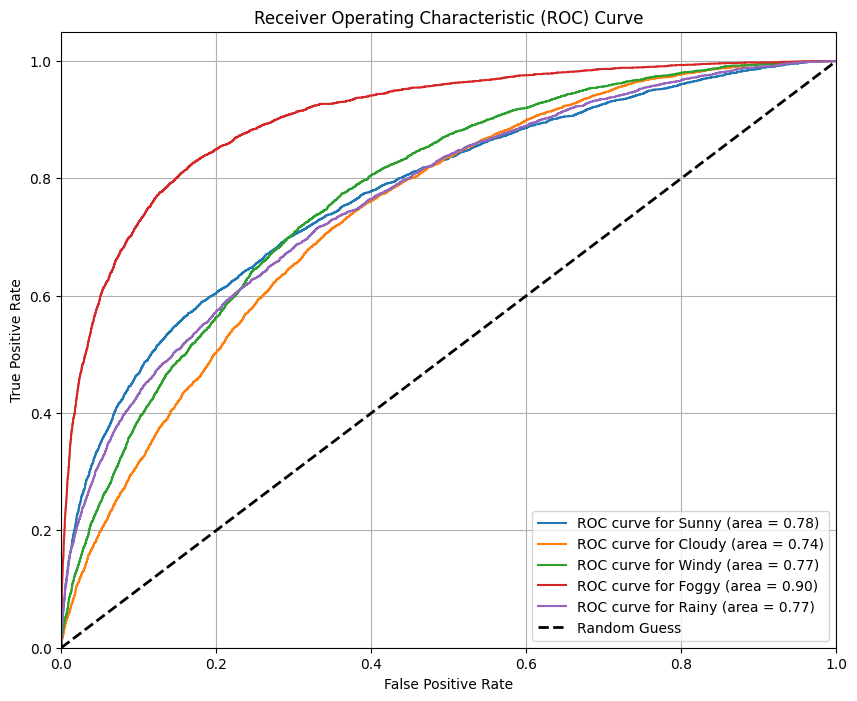

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import tensorflow as tf

# Get predictions from the test generator
# Note: This will run through the entire test set.
y_pred_probs = model.predict(test_generator)
y_pred = np.argmax(y_pred_probs, axis=1)

# Align true labels with predictions
# The test generator shuffles the data, so we need to get the true labels
# in the same order as the predictions.
y_true = test_generator.labels[:len(y_pred)]

# Get the one-hot encoded true labels for AUC/ROC
y_true_one_hot = tf.keras.utils.to_categorical(y_true, num_classes=len(idx_to_class))


# --- 1. Classification Report ---
print("\n--- Classification Report ---")
print(f"Number of test samples: {len(y_true)}")
print(classification_report(y_true, y_pred, target_names=idx_to_class))

# --- 2. Confusion Matrix ---
print("\n--- Confusion Matrix ---")
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=idx_to_class, yticklabels=idx_to_class)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# --- 3. Training and Testing Accuracy and Loss Graphs ---
print("\n--- Training and Testing Metrics ---")
# Assumes 'history' object from model training is still in memory
train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

# Plot Loss
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Testing Loss')
plt.title('Training and Testing Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

# Plot Accuracy
plt.subplot(1, 2, 2)
plt.plot(train_acc, label='Training Accuracy')
plt.plot(val_acc, label='Testing Accuracy')
plt.title('Training and Testing Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

# --- 4. AUC and ROC Graph ---
print("\n--- ROC Curve and AUC ---")
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(idx_to_class):
    fpr, tpr, _ = roc_curve(y_true_one_hot[:, i], y_pred_probs[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'ROC curve for {class_name} (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Guess')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()